In [2]:
# Load the Pandas libraries with alias 'pd' 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
def readDektakFile(fileName):
    # Read data from file 'filename.csv' 
    # (in the same directory that your python process is based)
    # Control delimiters, rows, column names with read_csv (see later) 
    data = pd.read_csv(fileName, skiprows=22) 
    # Preview the first 5 lines of the loaded data 
    data = data.drop(data.columns[2], axis=1)
    data = data.drop(data.columns[2], axis=1)
    data.head()
    height = np.swapaxes(data.to_numpy(), 0, 1)
    return height[0], height[1]

In [20]:
def stepSize(x,z, ths):
    plt.figure()
    plt.plot(x, z)
    threshold_h = max(z)*ths[0]
    threshold_l = max(z)*ths[1]
    plt.hlines([threshold_h, threshold_l], 0, 400)
    x_h = x[z>threshold_h]
    z_h = z[z>threshold_h]
    plt.scatter(x_h, z_h)
    x_l = x[z<threshold_l]
    z_l = z[z<threshold_l]
    plt.scatter(x_l, z_l)

    fit_h = np.polyfit(x_h, z_h, 1)
    p_h = np.poly1d(fit_h)
    plt.plot(x_h, p_h(x_h))

    fit_l = np.polyfit(x_l, z_l, 1)
    p_l = np.poly1d(fit_l)
    plt.plot(x_l, p_l(x_l))

    m = max(x)/2
    m_h = p_h(m)
    m_l = p_l(m)
    plt.vlines(m,m_l, m_h, color="red")
    return m_h-m_l
    



120  :  etch_data/group1/v2 2min SF6O2 plasma bulk Si.csv
60  :  etch_data/group1/v3 1min SF6O2 plasma bulk Si.csv
30  :  etch_data/group2/30s SF6O2 etch bulk Si sample3.csv
90  :  etch_data/group2/90s SF6O2 etch bulk Si sample3.csv
15  :  etch_data/group3/0-15-etch.csv
150  :  etch_data/group3/2-30-etch.csv
180  :  etch_data/group3/3-00-etch.csv


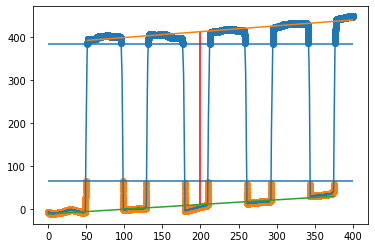

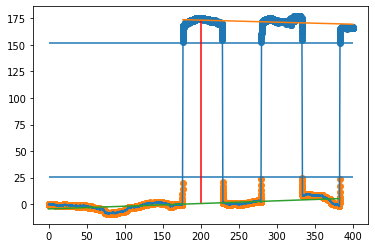

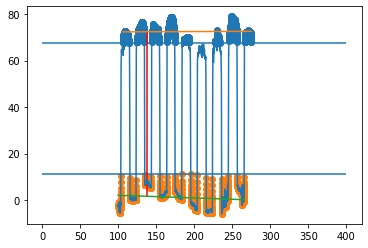

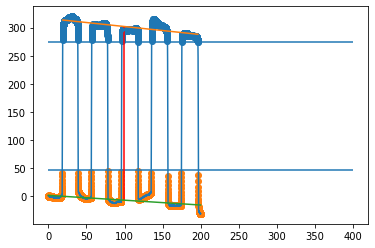

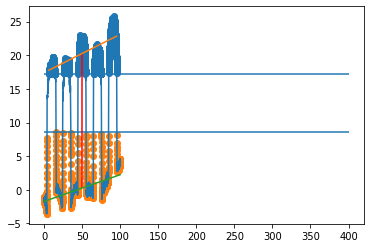

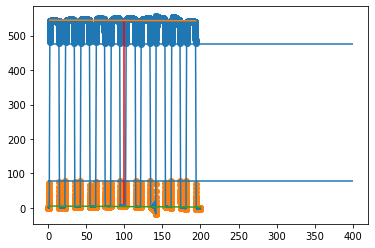

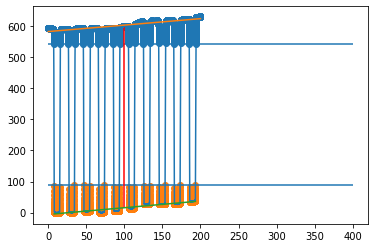

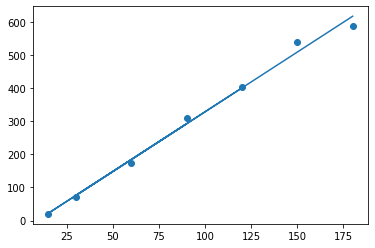

In [22]:
files={
    2*60:   "etch_data/group1/v2 2min SF6O2 plasma bulk Si.csv",
    1*60:   "etch_data/group1/v3 1min SF6O2 plasma bulk Si.csv",
    30:     "etch_data/group2/30s SF6O2 etch bulk Si sample3.csv",
    90:     "etch_data/group2/90s SF6O2 etch bulk Si sample3.csv",
    15:     "etch_data/group3/0-15-etch.csv",
    2*60+30:"etch_data/group3/2-30-etch.csv",
    3*60:   "etch_data/group3/3-00-etch.csv"
}

cuts = {
    30: (100,275)
}

thresh = {
    15: (2/3, 1/3)
}

steps = []
durs = []
for dur in files:
    file = files[dur]
    print(dur, " : ", file)
    ths = (6/7, 1/7)
    if dur in thresh:
        ths = thresh[dur]
    x,z = readDektakFile(file)
    if dur in cuts:
        interval = cuts[dur]
        cut = np.logical_and(x>interval[0],x<interval[1])
        z = z[cut]
        x = x[cut]
    steps.append(stepSize(x,z,ths))
    durs.append(dur)

thus etching 85 $nm$ deep requires 23.545s


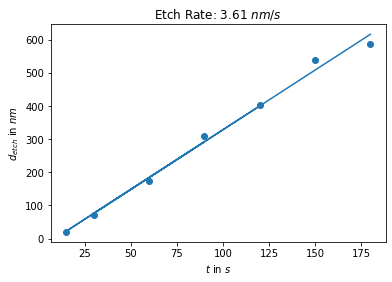

In [30]:
fit_er = np.polyfit(durs, steps, 1)
p_er = np.poly1d(fit_er)
plt.plot(durs, p_er(durs))
plt.scatter(durs, steps)
plt.xlabel("$t$ in $s$")
plt.ylabel("$d_{etch}$ in $nm$")
plt.title("Etch Rate: {} $nm/s$".format(round(fit_er[0],3)))
print("thus etching 85 nm deep requires {}s".format(round(85/fit_er[0],3)))